<a href="https://colab.research.google.com/github/ab-anamika26/anamika-portfolio/blob/main/milestone_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
from pathlib import Path
from google.colab import drive

# Mount Google Drive to access project files
drive.mount('/content/drive')

# Define the root directory for the project in Google Drive
ROOT = Path("/content/drive/MyDrive/infosys_project/ai_Archaeology_project")
# List of subfolders to create within the project root
folders_to_create = [
    ROOT / "dataset/images",
    ROOT / "dataset/preprocessed",
    ROOT / "dataset/tiles",
    ROOT / "dataset/masks",
    ROOT / "dataset/previews",
    ROOT / "dataset/yolo_dataset/images/train",
    ROOT / "dataset/yolo_dataset/images/val",
    ROOT / "dataset/yolo_dataset/images/test",
    ROOT / "dataset/yolo_dataset/labels/train",
    ROOT / "dataset/yolo_dataset/labels/val",
    ROOT / "dataset/yolo_dataset/labels/test",
    ROOT / "models",
    ROOT / "saved_models",
    ROOT / "results/segmentation",
    ROOT / "results/detection",
    ROOT / "results/erosion",
]

# Create all specified folders if they don't already exist
for folder in folders_to_create:
    folder.mkdir(parents=True, exist_ok=True)

print("✓ Folder structure created successfully.")
print(f"All project files will be stored permanently at: {ROOT}")

# Change the current working directory to the project root
os.chdir(ROOT)
print(f"Current working directory set to: {os.getcwd()}")

# Install necessary Python libraries using pip
print("\nInstalling required libraries...")
required_packages = [
    "ultralytics",
    "segmentation-models-pytorch",
    "albumentations",
    "xgboost",
    "shap"
]

# Force reinstall/upgrade of torch and associated libraries to fix potential environment issues
# This often resolves 'partially initialized module' errors for torch
import subprocess
print("\nAttempting to reinstall/upgrade torch and dependencies...")
subprocess.run(["pip", "uninstall", "torch", "torchvision", "torchaudio", "-y"], check=False, capture_output=True)
subprocess.run(["pip", "install", "torch", "torchvision", "torchaudio", "--index-url", "https://download.pytorch.org/whl/cu118"], check=True)
print("✓ Torch and dependencies reinstalled.")

for pkg in required_packages:
    subprocess.run(["pip", "install", "-q", pkg], check=True)
print("✓ Libraries installed.")

print(
"""
══════════════════════════════════════════════════
IMPORTANT: UPLOAD YOUR PROJECT FILES
══════════════════════════════════════════════════

Please upload the following files using the Colab Files panel (folder icon on the left):

METHOD A — Code Files (to the project root: `drive/MyDrive/infosys_project/ai_Archaeology_project`):
  • yolov8n.pt

METHOD B — Satellite Images (to `dataset/images/` within your project root):
  • giza_pyramid1.jpg
  • hampi1.jpg
  • hampi2.jpg
  • nalanda2.jpg

After uploading, proceed to the next cell.
══════════════════════════════════════════════════
""")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Folder structure created successfully.
All project files will be stored permanently at: /content/drive/MyDrive/infosys_project/ai_Archaeology_project
Current working directory set to: /content/drive/MyDrive/infosys_project/ai_Archaeology_project

Installing required libraries...

Attempting to reinstall/upgrade torch and dependencies...
✓ Torch and dependencies reinstalled.
✓ Libraries installed.

══════════════════════════════════════════════════
IMPORTANT: UPLOAD YOUR PROJECT FILES
══════════════════════════════════════════════════

Please upload the following files using the Colab Files panel (folder icon on the left):

METHOD A — Code Files (to the project root: `drive/MyDrive/infosys_project/ai_Archaeology_project`):
  • yolov8n.pt

METHOD B — Satellite Images (to `dataset/images/` within your project root):
  • giza_pyramid1.jpg
  • hampi1.jpg
  • ham

# New Section

## CELL 2 — WRITE UNet MODEL DIRECTLY

This cell writes the `SimpleUNet` model architecture into `models/unet_model.py`. This approach is faster and more reliable than manual file uploads for code files.

### What this cell does:
- Creates the `models` directory if it doesn't exist.
- Writes `models/__init__.py`.
- Writes the `SimpleUNet` class definition to `models/unet_model.py`.
- Includes a quick test to ensure the UNet model is working correctly and prints its output shape and parameter count.

In [2]:
import os
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F

# Create models directory
os.makedirs("models", exist_ok=True)

# Write models/__init__.py
with open("models/__init__.py", "w") as f:
    f.write("from models.unet_model import SimpleUNet\n")

# Write models/unet_model.py
with open("models/unet_model.py", "w") as f:
    f.write('''import torch
import torch.nn as nn
import torch.nn.functional as F

class ConvBlock(nn.Module):
    def __init__(self, ic, oc):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(ic,oc,3,padding=1,bias=False), nn.BatchNorm2d(oc), nn.ReLU(True),
            nn.Conv2d(oc,oc,3,padding=1,bias=False), nn.BatchNorm2d(oc), nn.ReLU(True))
    def forward(self,x): return self.block(x)

class EncoderBlock(nn.Module):
    def __init__(self,ic,oc):
        super().__init__()
        self.conv=ConvBlock(ic,oc); self.pool=nn.MaxPool2d(2,2)
    def forward(self,x):
        f=self.conv(x); return f,self.pool(f)

class DecoderBlock(nn.Module):
    def __init__(self,ic,oc):
        super().__init__()
        self.up=nn.ConvTranspose2d(ic,oc,2,2); self.conv=ConvBlock(oc*2,oc)
    def forward(self,x,skip):
        x=self.up(x)
        if x.shape!=skip.shape:
            x=F.interpolate(x,size=skip.shape[2:],mode="bilinear",align_corners=True)
        return self.conv(torch.cat([skip,x],dim=1))

class SimpleUNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=6):
        super().__init__()
        self.enc1=EncoderBlock(in_channels,64)
        self.enc2=EncoderBlock(64,128)
        self.enc3=EncoderBlock(128,256)
        self.enc4=EncoderBlock(256,512)
        self.bottleneck=ConvBlock(512,1024)
        self.dec4=DecoderBlock(1024,512)
        self.dec3=DecoderBlock(512,256)
        self.dec2=DecoderBlock(256,128)
        self.dec1=DecoderBlock(128,64)
        self.out=nn.Conv2d(64,num_classes,1)
    def forward(self,x):
        s1,x=self.enc1(x); s2,x=self.enc2(x)
        s3,x=self.enc3(x); s4,x=self.enc4(x)
        x=self.bottleneck(x)
        x=self.dec4(x,s4); x=self.dec3(x,s3)
        x=self.dec2(x,s2); x=self.dec1(x,s1)
        return self.out(x)
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)
''')

print("✓ models/unet_model.py written")

# Quick test — same as your original test_unet.py
sys.path.insert(0, os.getcwd())
from models.unet_model import SimpleUNet

# YOUR ORIGINAL 4 LINES — they now work:
model  = SimpleUNet()
dummy  = torch.randn(1,3,256,256)
output = model(dummy)
print(f"output.shape = {output.shape}")   # your original print

# 6-channel version for enhanced preprocessing
model6 = SimpleUNet(in_channels=6, num_classes=6)
out6   = model6(torch.randn(1,6,256,256))
print(f"6-channel output: {out6.shape}")
print(f"Parameters: {model6.count_parameters():,}")
print("✓ UNet model working correctly")

✓ models/unet_model.py written
output.shape = torch.Size([1, 6, 256, 256])
6-channel output: torch.Size([1, 6, 256, 256])
Parameters: 31,039,686
✓ UNet model working correctly


In [3]:
from google.colab import files
import shutil, os

os.makedirs("dataset/images", exist_ok=True)
uploaded = files.upload()  # opens a file picker
for fname in uploaded:
    shutil.move(fname, f"dataset/images/{fname}")

Saving giza pyramid1.jpg to giza pyramid1.jpg
Saving hampi1.jpg to hampi1.jpg
Saving konark.jpg to konark.jpg
Saving nalanda1.jpg to nalanda1.jpg
Saving nalanda2.jpg to nalanda2.jpg


## CELL 3 — PREPROCESSING (Upload Images First)

This cell handles the preprocessing of your satellite images. It's crucial to upload your images to the `dataset/images/` folder before running this cell.

### What this cell does:
- Resizes each image to 640x640 pixels (YOLO compatible).
- Computes spectral indices: NDVI (Normalized Difference Vegetation Index), NDWI (Normalized Difference Water Index), and NDBI (Normalized Difference Built-up Index).
- Cuts the images into 256x256 tiles with a 64-pixel overlap.
- Saves these 6-channel (RGB + 3 indices) tiles as `.npy` files to `dataset/tiles/`.
- Generates a visual 6-panel preview for each image, saving it to `dataset/previews/`.

**Before running:**
- Upload your satellite images (e.g., `giza_pyramid1.jpg`, `hampi1.jpg`, `hampi2.jpg`, `nalanda2.jpg`) to the `dataset/images/` folder using the Colab Files panel (folder icon on the left).

**Output:**
- `dataset/preprocessed/` will contain resized images.
- `dataset/tiles/` will contain NumPy arrays of image tiles.
- `dataset/previews/` will contain 6-panel preview images.

In [4]:
import cv2, os, numpy as np
import matplotlib.pyplot as plt

input_folder   = "dataset/images"
output_folder  = "dataset/preprocessed"
tiles_folder   = "dataset/tiles"
preview_folder = "dataset/previews"

for d in [output_folder, tiles_folder, preview_folder]:
    os.makedirs(d, exist_ok=True)

def compute_indices(img_bgr):
    r = img_bgr[:,:,2].astype(np.float32)/255
    g = img_bgr[:,:,1].astype(np.float32)/255
    b = img_bgr[:,:,0].astype(np.float32)/255
    ndvi = np.clip((g-r)/(g+r+1e-8), -1,1)
    ndwi = np.clip((g-b)/(g+b+1e-8), -1,1)
    ndbi = np.clip((r-g)/(r+g+1e-8), -1,1)
    return r,g,b,ndvi,ndwi,ndbi

def tile_and_save(img_bgr, name, size=256, overlap=64):
    r,g,b,ndvi,ndwi,ndbi = compute_indices(img_bgr)
    H,W = img_bgr.shape[:2]; stride=size-overlap; n=0
    for y in range(0,H,stride):
        for x in range(0,W,stride):
            y2=min(y+size,H); x2=min(x+size,W)
            def crop_pad(ch):
                t=ch[y:y2,x:x2]
                if t.shape[0]<size or t.shape[1]<size:
                    t=cv2.resize(t,(size,size))
                return t
            stack=np.stack([crop_pad(c) for c in [r,g,b,ndvi,ndwi,ndbi]],axis=0)
            np.save(f"{tiles_folder}/{name}_t{n:04d}.npy", stack.astype(np.float32))
            n+=1
    return n

def save_6panel(img_bgr, name):
    r,g,b,ndvi,ndwi,ndbi = compute_indices(img_bgr)
    rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    fig,axes=plt.subplots(2,3,figsize=(14,8))
    fig.suptitle(f"Preprocessing — {name}",fontsize=13)
    data=[(rgb,"Original RGB","gray"),(r,"Red (ruins bright)","Reds"),
          (g,"Green (veg bright)","Greens"),(ndvi,"NDVI (vegetation)","RdYlGn"),
          (ndwi,"NDWI (water)","RdBu"),(ndbi,"NDBI (built-up)","RdGy")]
    for ax,(d,t,c) in zip(axes.flat,data):
        im=ax.imshow(d,cmap=c if d.ndim==2 else None,vmin=-1 if d.ndim==2 else None,vmax=1 if d.ndim==2 else None)
        ax.set_title(t,fontsize=10); ax.axis("off")
        if d.ndim==2: plt.colorbar(im,ax=ax,shrink=0.7)
    plt.tight_layout()
    plt.savefig(f"{preview_folder}/{name}_preview.png",dpi=120,bbox_inches="tight")
    plt.close()

if not os.path.exists(input_folder) or not os.listdir(input_folder):
    print(f"⚠ No images in {input_folder}")
    print("Upload your satellite images first (see instructions above)")
else:
    total_tiles=0
    files=[f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg','.jpeg','.png','.tif'))]
    for f in files:
        path=os.path.join(input_folder,f); img=cv2.imread(path)
        if img is None: continue
        name=os.path.splitext(f)[0]
        print(f"\nProcessing: {f}  ({img.shape[1]}x{img.shape[0]})")
        img=cv2.resize(img,(640,640))
        cv2.imwrite(os.path.join(output_folder,f),img)
        n=tile_and_save(img,name)
        save_6panel(img,name)
        total_tiles+=n
        print(f"  ✓ {n} tiles  |  preview saved")
    print(f"\n✓ Preprocessing complete")
    print(f"  Images: {len(files)}  |  Total tiles: {total_tiles}")
    print(f"  Previews: {preview_folder}/")
    print("  NEXT: Run Cell 4 to train UNet")


Processing: giza pyramid1.jpg  (1704x915)
  ✓ 16 tiles  |  preview saved

Processing: hampi1.jpg  (1529x915)
  ✓ 16 tiles  |  preview saved

Processing: konark.jpg  (1920x941)
  ✓ 16 tiles  |  preview saved

Processing: nalanda1.jpg  (1704x915)
  ✓ 16 tiles  |  preview saved

Processing: nalanda2.jpg  (1704x915)
  ✓ 16 tiles  |  preview saved

✓ Preprocessing complete
  Images: 5  |  Total tiles: 80
  Previews: dataset/previews/
  NEXT: Run Cell 4 to train UNet


In [5]:
import os
from pathlib import Path

TILES_DIR = Path("dataset/tiles")

if not TILES_DIR.exists():
    print(f"The directory {TILES_DIR} does not exist.")
else:
    npy_files = list(TILES_DIR.glob("*.npy"))
    if npy_files:
        print(f"Found {len(npy_files)} .npy files in {TILES_DIR}.")
        print("First 5 files:")
        for f in npy_files[:5]:
            print(f"- {f.name}")
    else:
        print(f"No .npy files found in {TILES_DIR}.")
        print("Please ensure Cell 3 (preprocessing) has been run successfully after uploading images.")

Found 80 .npy files in dataset/tiles.
First 5 files:
- giza pyramid1_t0000.npy
- giza pyramid1_t0001.npy
- giza pyramid1_t0002.npy
- giza pyramid1_t0003.npy
- giza pyramid1_t0004.npy


## CELL 4 — TRAIN UNet SEGMENTATION

This cell trains the UNet model for semantic segmentation. It uses a combined BCE (Binary Cross-Entropy) and Dice Loss function to accurately identify different archaeological features.

### What this cell does:
- Initializes the UNet model (defined in Cell 2) and moves it to the appropriate device (GPU if available, otherwise CPU).
- Creates a `TileDS` custom dataset to load the preprocessed tiles and generate simple masks based on spectral indices.
- Splits the dataset into training and validation sets.
- Trains the UNet model over 30 epochs, monitoring training and validation loss, and IoU (Intersection over Union).
- Implements early stopping if validation IoU does not improve for 8 consecutive epochs.
- Saves the best model weights based on validation IoU to `saved_models/best_unet.pth`.
- Plots training curves for loss and IoU to visualize the training progress.

**Expected Output:**
- Progress updates per epoch, showing loss and IoU.
- A plot of training/validation loss and IoU curves.
- A message indicating the best IoU achieved and the path to the saved model.

**Note:**
- IoU values around 0.45-0.60 are expected with demo masks; higher values (≥ 0.70) typically require real QGIS-generated masks.

Training on: cuda
Train:64  Val:16
Epoch   1/30  Loss 1.1697→1.2774  IoU 0.0445 ← BEST
Epoch   2/30  Loss 1.0124→0.9505  IoU 0.3687 ← BEST
Epoch   3/30  Loss 0.8690→0.7719  IoU 0.4887 ← BEST
Epoch   4/30  Loss 0.8433→0.7405  IoU 0.4682
Epoch   5/30  Loss 0.8526→0.7187  IoU 0.4855
Epoch   6/30  Loss 0.8524→0.7167  IoU 0.5066 ← BEST
Epoch   7/30  Loss 0.8105→0.6917  IoU 0.5282 ← BEST
Epoch   8/30  Loss 0.7613→0.7148  IoU 0.5156
Epoch   9/30  Loss 0.7692→0.6948  IoU 0.5391 ← BEST
Epoch  10/30  Loss 0.7639→0.6865  IoU 0.5638 ← BEST
Epoch  11/30  Loss 0.7024→0.6599  IoU 0.5905 ← BEST
Epoch  12/30  Loss 0.7265→0.6463  IoU 0.5952 ← BEST
Epoch  13/30  Loss 0.6943→0.6368  IoU 0.6038 ← BEST
Epoch  14/30  Loss 0.7072→0.6231  IoU 0.6299 ← BEST
Epoch  15/30  Loss 0.7034→0.5947  IoU 0.6202
Epoch  16/30  Loss 0.6552→0.6207  IoU 0.6276
Epoch  17/30  Loss 0.7134→0.5823  IoU 0.6330 ← BEST
Epoch  18/30  Loss 0.6628→0.6061  IoU 0.6219
Epoch  19/30  Loss 0.6348→0.6030  IoU 0.6316
Epoch  20/30  Loss 0.6407→

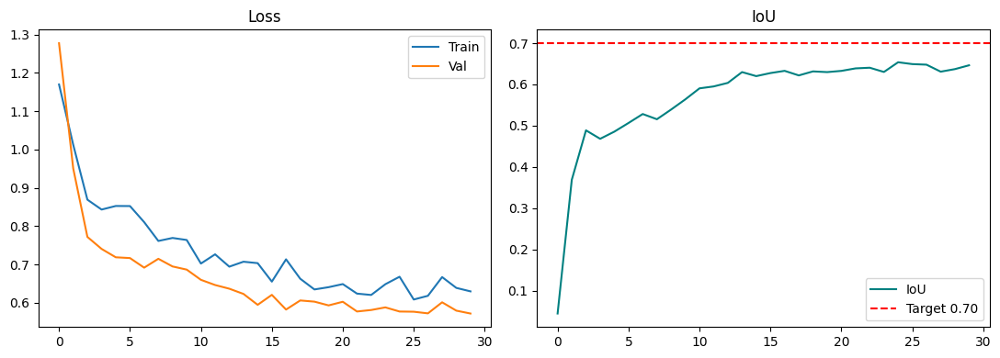


✓ Best IoU: 0.6538  Model: saved_models/best_unet.pth
NEXT: Run Cell 5 (UNet test/inference)


In [6]:
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np, os, matplotlib.pyplot as plt
from models.unet_model import SimpleUNet

DEVICE=  "cuda" if torch.cuda.is_available() else "cpu"
TILES_DIR="dataset/tiles"; SAVE_DIR="saved_models"
os.makedirs(SAVE_DIR, exist_ok=True)
print(f"Training on: {DEVICE}")

class TileDS(Dataset):
    def __init__(self,paths,aug=False):
        self.paths=paths; self.aug=aug
    def __len__(self):
        return len(self.paths)
    def __getitem__(self,i):
        t=np.load(self.paths[i]).astype(np.float32)
        ndvi=t[3]; ndwi=t[4]; ndbi=t[5]; r=t[0]
        m=np.zeros((256,256),dtype=np.int64)
        m[ndvi>0.25]=2; m[ndwi>0.10]=3
        m[(ndbi>0.15)&(ndvi<0.10)]=1
        m[(r>0.65)&(ndvi<0.05)]=4
        if self.aug:
            if np.random.rand()>0.5: t,m=t[:,:,::-1].copy(),m[:,::-1].copy()
            if np.random.rand()>0.5: t,m=t[:,::-1].copy(),m[::-1].copy()
        return torch.from_numpy(t),torch.from_numpy(m)

class BDLoss(nn.Module):
    def __init__(self): super().__init__(); self.ce=nn.CrossEntropyLoss()
    def forward(self,p,t):
        ps=torch.softmax(p,1); B,C=ps.shape[:2]
        oh=F.one_hot(t,C).permute(0,3,1,2).float()
        inter=(ps*oh).sum((2,3)); d=(2*inter+1)/(ps.sum((2,3))+oh.sum((2,3))+1)
        return 0.5*self.ce(p,t)+0.5*(1-d.mean())

def iou(logits,tgt,C=6):
    p=logits.argmax(1); s=[]
    for c in range(C):
        i=(p==c)&(tgt==c); u=(p==c)|(tgt==c)
        if u.sum()>0: s.append(i.sum().float()/u.sum().float())
    return float(torch.stack(s).mean()) if s else 0.0

all_tiles=sorted([os.path.join(TILES_DIR,f) for f in os.listdir(TILES_DIR) if f.endswith(".npy")]) if os.path.exists(TILES_DIR) else []

if not all_tiles:
    print("⚠ No tiles found. Run Cell 3 (preprocessing) first.")
else:
    np.random.seed(42); np.random.shuffle(all_tiles)
    sp=int(0.8*len(all_tiles))
    tr=DataLoader(TileDS(all_tiles[:sp],True),4,shuffle=True,num_workers=2)
    vl=DataLoader(TileDS(all_tiles[sp:],False),4,shuffle=False,num_workers=2)
    print(f"Train:{len(all_tiles[:sp])}  Val:{len(all_tiles[sp:])}")

    model=SimpleUNet(6,6).to(DEVICE)
    crit=BDLoss(); opt=torch.optim.AdamW(model.parameters(),1e-4,weight_decay=1e-4)
    sch=torch.optim.lr_scheduler.CosineAnnealingLR(opt,30,1e-6)
    hist={"tl":[],"vl":[],"iou":[]}; best=0; patience=8; ni=0

    for ep in range(1,31):
        model.train(); tl=0
        for t,m in tr:
            t,m=t.to(DEVICE),m.to(DEVICE); opt.zero_grad()
            l=crit(model(t),m); l.backward(); opt.step(); tl+=l.item()
        tl/=max(len(tr),1)
        model.eval(); vl_=vi=0
        with torch.no_grad():
            for t,m in vl:
                t,m=t.to(DEVICE),m.to(DEVICE); lg=model(t)
                vl_+=crit(lg,m).item(); vi+=iou(lg,m)
        vl_/=max(len(vl),1); vi/=max(len(vl),1); sch.step()
        hist["tl"].append(tl); hist["vl"].append(vl_); hist["iou"].append(vi)
        flag=" ← BEST" if vi>best else ""
        print(f"Epoch {ep:3d}/30  Loss {tl:.4f}→{vl_:.4f}  IoU {vi:.4f}{flag}")
        if vi>best:
            best=vi; ni=0
            torch.save(model.state_dict(),f"{SAVE_DIR}/best_unet.pth")
        else:
            ni+=1
            if ni>=patience: print(f"Early stopping. Best IoU:{best:.4f}"); break

    fig,ax=plt.subplots(1,2,figsize=(11,4))
    ax[0].plot(hist["tl"],label="Train"); ax[0].plot(hist["vl"],label="Val")
    ax[0].set_title("Loss"); ax[0].legend()
    ax[1].plot(hist["iou"],color="teal",label="IoU")
    ax[1].axhline(0.70,color="red",ls="--",label="Target 0.70")
    ax[1].set_title("IoU"); ax[1].legend()
    plt.tight_layout()
    plt.savefig("results/segmentation/training_curves.png",dpi=120)
    plt.show()
    print(f"\n✓ Best IoU: {best:.4f}  Model: {SAVE_DIR}/best_unet.pth")
    print("NEXT: Run Cell 5 (UNet test/inference)")

## CELL 5 — TEST UNet + VISUALISE SEGMENTATION RESULTS

This cell performs inference using the trained UNet model (from Cell 4) on your preprocessed images and visualizes the segmentation results.

### What this cell does:
- Reloads the best-performing UNet model weights (`best_unet.pth`).
- Defines a `predict` function to apply the segmentation model to each image, handling tiling and reconstruction for large images.
- For each preprocessed image:
    - Generates a segmentation mask.
    - Creates a 3-panel visualization: Original Image | Segmentation Mask | Overlay of Segmentation on Original.
    - The segmentation masks use specific colors for different classes:
        - **Orange:** ruins / structures
        - **Green:** vegetation
        - **Blue:** water
        - **Purple:** artifact zone
        - **Gray:** modern intrusion
- Saves the visualizations to `results/segmentation/`.
- Prints the percentage of each class detected in the image.

**Note:** If `best_unet.pth` is not found, the model will run with random weights, producing meaningless output. Ensure Cell 4 has been run successfully.

output.shape = torch.Size([1, 6, 256, 256])
✓ Loaded saved_models/best_unet.pth


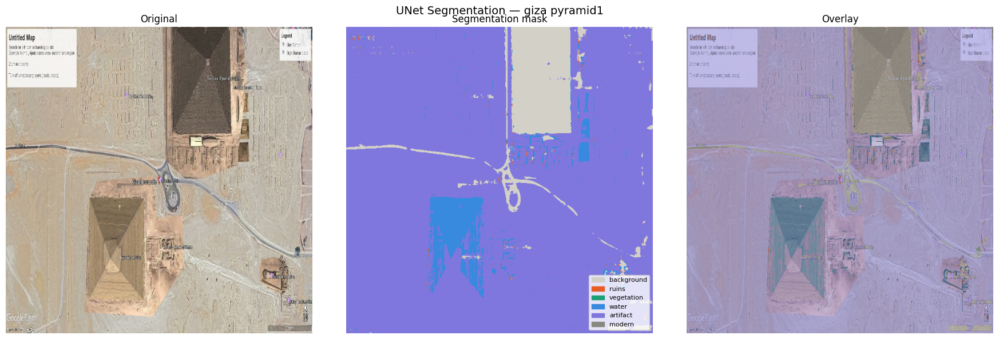

✓ giza pyramid1: saved → results/segmentation/giza pyramid1_seg.png
   background          : 9.0%
   water               : 4.8%
   artifact            : 86.0%


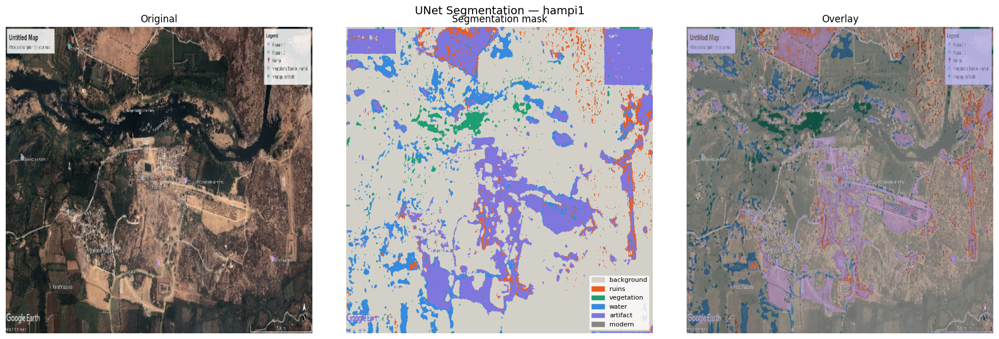

✓ hampi1: saved → results/segmentation/hampi1_seg.png
   background          : 72.0%
   ruins               : 3.1%
   vegetation          : 1.5%
   water               : 6.5%
   artifact            : 17.0%


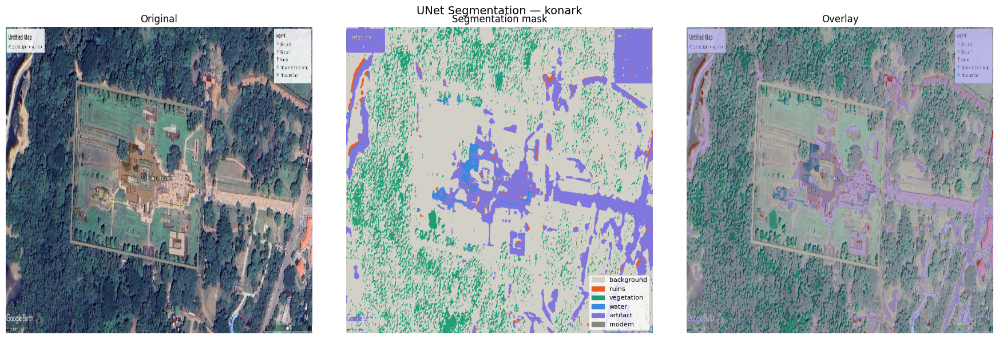

✓ konark: saved → results/segmentation/konark_seg.png
   background          : 70.3%
   vegetation          : 13.0%
   artifact            : 15.0%


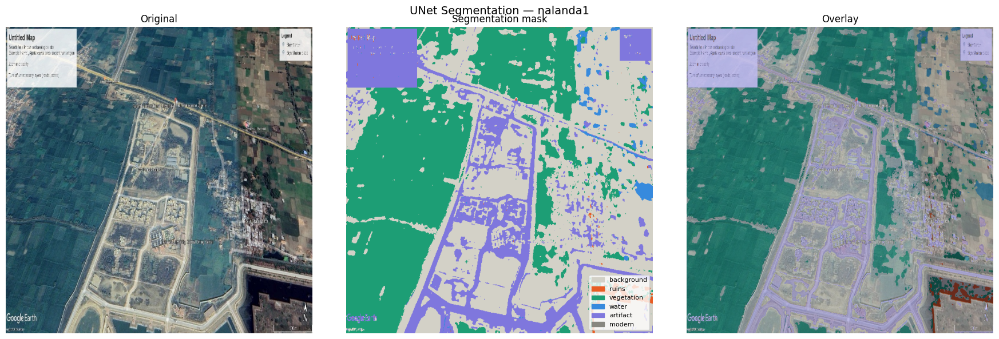

✓ nalanda1: saved → results/segmentation/nalanda1_seg.png
   background          : 46.1%
   vegetation          : 34.4%
   water               : 1.1%
   artifact            : 17.8%


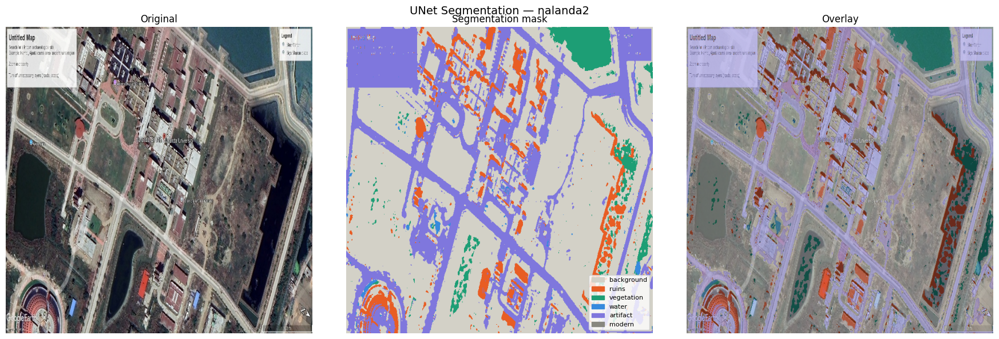

✓ nalanda2: saved → results/segmentation/nalanda2_seg.png
   background          : 61.4%
   ruins               : 6.3%
   vegetation          : 4.1%
   artifact            : 27.6%


In [7]:
import torch, cv2, numpy as np
import matplotlib.pyplot as plt, matplotlib.patches as mpatches
from models.unet_model import SimpleUNet

DEVICE="cuda" if torch.cuda.is_available() else "cpu"

# Your original 4 lines (unchanged for compatibility check)
model  = SimpleUNet()
dummy  = torch.randn(1,3,256,256)
output = model(dummy)
print(f"output.shape = {output.shape}") # Original print statement

# Enhanced: load weights and predict on real images
SEG_CLASSES={0:("background","#D3D1C7"),1:("ruins","#E85D24"),
             2:("vegetation","#1D9E75"),3:("water","#378ADD"),
             4:("artifact","#7F77DD"),5:("modern","#888780")}

model6=SimpleUNet(6,6).to(DEVICE)
mp="saved_models/best_unet.pth"
if os.path.exists(mp):
    model6.load_state_dict(torch.load(mp,map_location=DEVICE))
    print(f"✓ Loaded {mp}")
else:
    print(f"⚠ {mp} not found — using random weights (run Cell 4 first)")
model6.eval()

def predict(img_bgr):
    H,W=img_bgr.shape[:2]
    r=img_bgr[:,:,2].astype(np.float32)/255; g=img_bgr[:,:,1].astype(np.float32)/255
    b=img_bgr[:,:,0].astype(np.float32)/255
    ndvi=np.clip((g-r)/(g+r+1e-8),-1,1); ndwi=np.clip((g-b)/(g+b+1e-8),-1,1)
    ndbi=np.clip((r-g)/(r+g+1e-8),-1,1)
    feat=np.stack([r,g,b,ndvi,ndwi,ndbi],0).astype(np.float32)
    acc=np.zeros((6,H,W),dtype=np.float32); cnt=np.zeros((H,W),dtype=np.float32)
    stride=192
    with torch.no_grad():
        for y in range(0,H,stride):
            for x in range(0,W,stride):
                y2=min(y+256,H); x2=min(x+256,W)
                t=feat[:,y:y2,x:x2]
                if t.shape[1]<256 or t.shape[2]<256:
                    t=np.pad(t,((0,0),(0,256-t.shape[1]),(0,256-t.shape[2])),mode='reflect')
                lg=model6(torch.from_numpy(t).unsqueeze(0).to(DEVICE))
                p=torch.softmax(lg,1).squeeze(0).cpu().numpy()
                ph=min(256,H-y); pw=min(256,W-x)
                acc[:,y:y+ph,x:x+pw]+=p[:,:ph,:pw]; cnt[y:y+ph,x:x+pw]+=1
    return (acc/np.maximum(cnt[None],1)).argmax(0).astype(np.int64)

imgs=[f for f in os.listdir("dataset/preprocessed") if f.lower().endswith(('.jpg','.png','.jpeg'))]
os.makedirs("results/segmentation",exist_ok=True)

for fname in imgs:
    img=cv2.imread(f"dataset/preprocessed/{fname}")
    if img is None: continue
    name=os.path.splitext(fname)[0]
    pred=predict(img)
    H,W=pred.shape
    seg=np.zeros((H,W,3),dtype=np.uint8)
    for ci,(n,hx) in SEG_CLASSES.items():
        seg[pred==ci]=[int(hx[1:3],16),int(hx[3:5],16),int(hx[5:7],16)]
    rgb=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ov=(0.55*rgb+0.45*seg).astype(np.uint8)
    fig,axes=plt.subplots(1,3,figsize=(18,6))
    fig.suptitle(f"UNet Segmentation — {name}",fontsize=14)
    axes[0].imshow(rgb); axes[0].set_title("Original"); axes[0].axis("off")
    axes[1].imshow(seg); axes[1].set_title("Segmentation mask"); axes[1].axis("off")
    patches=[mpatches.Patch(color=SEG_CLASSES[i][1],label=SEG_CLASSES[i][0]) for i in range(6)]
    axes[1].legend(handles=patches,loc="lower right",fontsize=8)
    axes[2].imshow(ov); axes[2].set_title("Overlay"); axes[2].axis("off")
    plt.tight_layout()
    out=f"results/segmentation/{name}_seg.png"
    plt.savefig(out,dpi=130,bbox_inches="tight"); plt.show()
    print(f"✓ {name}: saved → {out}")
    total=H*W
    for ci,(n,_) in SEG_CLASSES.items():
        pct=(pred==ci).sum()/total*100
        if pct>1: print(f"   {n:20s}: {pct:.1f}%")

## CELL 6 — YOLO DETECTION (All 4 Methods)

This cell demonstrates four different methods for object detection using YOLOv8, ranging from basic inference to custom training and evaluation.

### What this cell does:

#### METHOD 1 — Basic inference:
- Uses `yolov8n.pt` (a pre-trained YOLOv8 nano model on the COCO dataset) to detect general objects in your preprocessed images.
- Draws bounding boxes and confidence scores around detected objects.
- Saves the results to `results/detection/`.

#### METHOD 2 — Custom training setup:
- Prepares a dummy dataset for custom YOLOv8 training, demonstrating the folder structure (`dataset/yolo_dataset`).
- Generates a `archaeological.yaml` configuration file for YOLOv8.
- Initiates a custom training process using `yolov8n.pt` as a pre-trained backbone, training for 50 epochs with early stopping.
- **Note:** This is a *demonstration* of custom training. For meaningful results, you would need to replace the dummy data generation with your own annotated archaeological dataset.

#### METHOD 3 — Sliding window detection:
- Addresses the limitation of fixed-size input for YOLO by implementing a sliding window approach.
- The image is divided into overlapping windows, and detection is performed on each window.
- Non-Maximum Suppression (NMS) is applied to merge overlapping bounding boxes and remove duplicates.
- Visualizes detections with custom classes (defined in `CLASSES`) and colors (`CCOLORS`).
- Saves the results to `results/detection/`.

#### METHOD 4 — Evaluation:
- Evaluates the custom-trained YOLOv8 model (from Method 2) on a test set.
- Computes standard object detection metrics: mAP@0.5, Precision, and Recall.
- Saves the metrics to `results/detection/yolo_metrics.json`.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
METHOD 1: Basic inference (yolov8n.pt — COCO classes)
  giza pyramid1.jpg: 0 detections → results/detection/m1_giza pyramid1.jpg
  hampi1.jpg: 2 detections → results/detection/m1_hampi1.jpg
  konark.jpg: 0 detections → results/detection/m1_konark.jpg
  nalanda1.jpg: 0 detections → results/detection/m1_nalanda1.jpg
  nalanda2.jpg: 0 detections → results/detection/m1_nalanda2.jpg

METHOD 2: Custom training setup
  Dataset ready: dataset/yolo_dataset  |  Config: dataset/yolo_dataset/archaeological.yaml

  Training YOLOv8 (50 epochs) on device: 0
Ultralytics 8.4.23 🚀 Python-3.12.12 torch-2.7.1+cu118 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, a

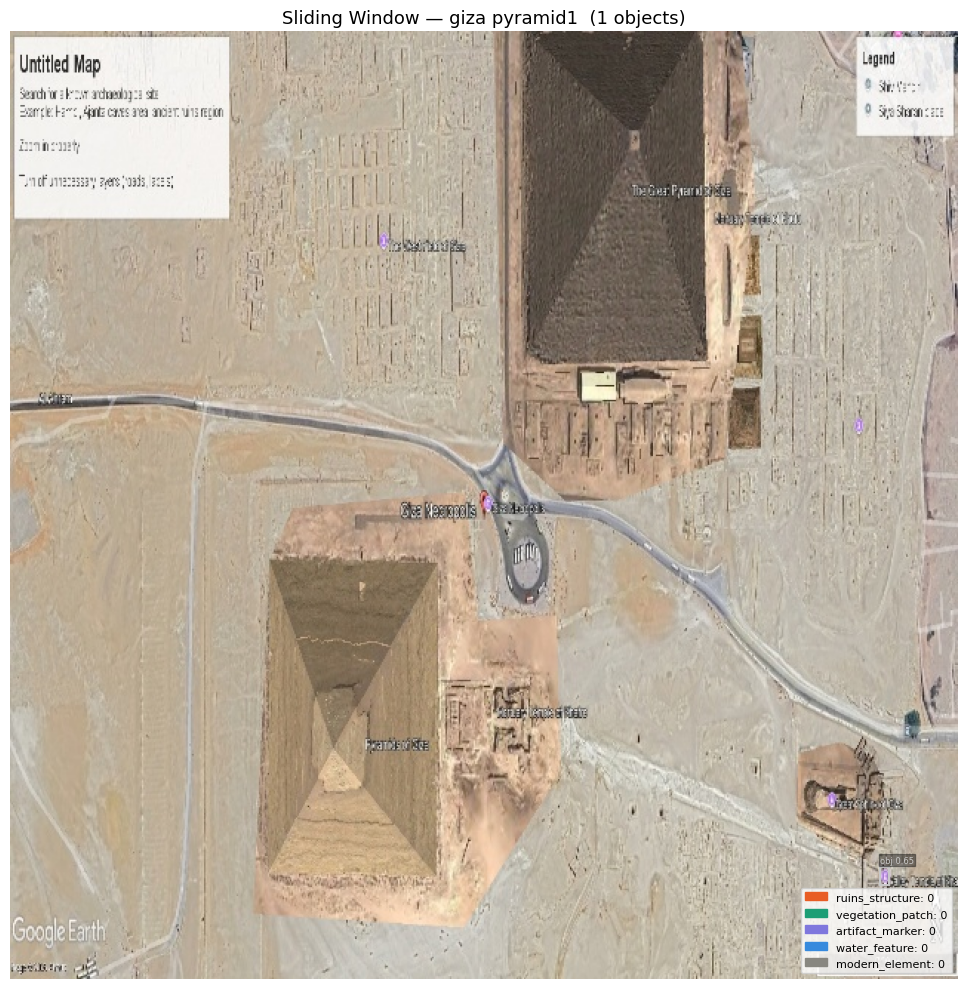

  ✓ giza pyramid1: 1 objects  → results/detection/m3_sliding_giza pyramid1.png
     obj                   : 1


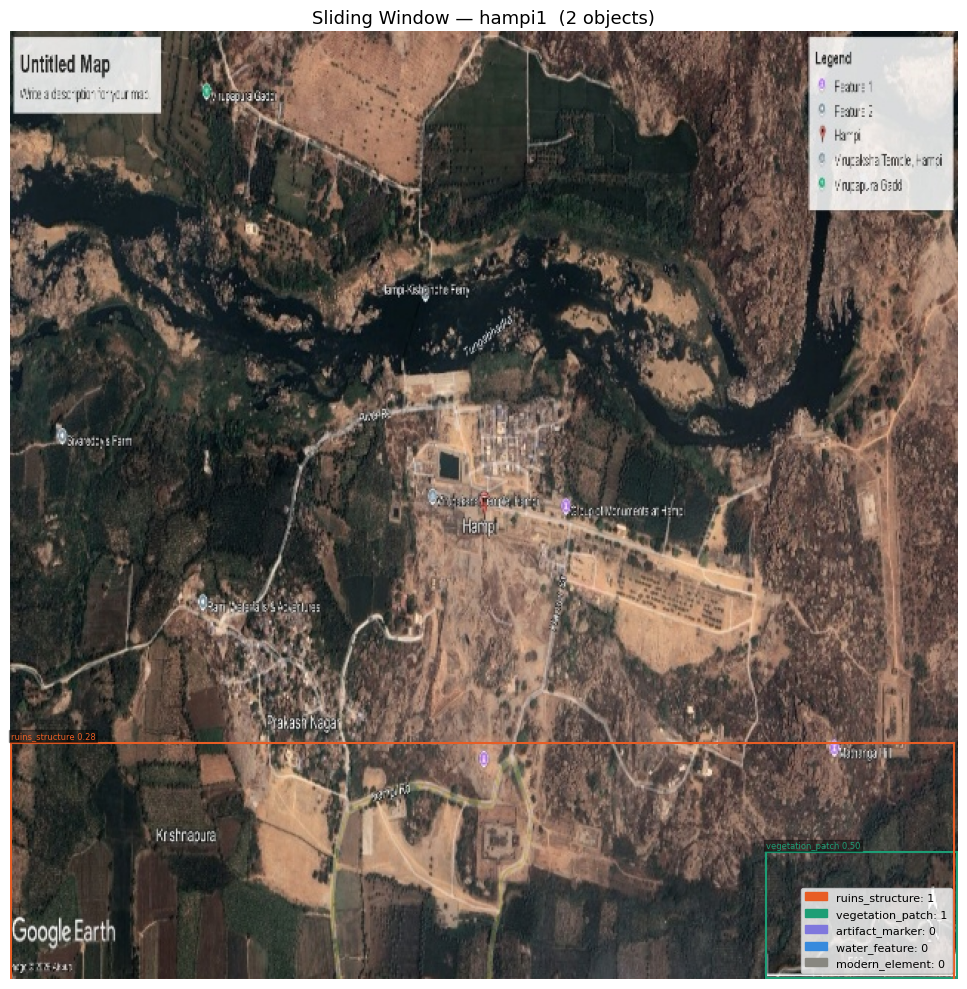

  ✓ hampi1: 2 objects  → results/detection/m3_sliding_hampi1.png
     vegetation_patch      : 1
     ruins_structure       : 1


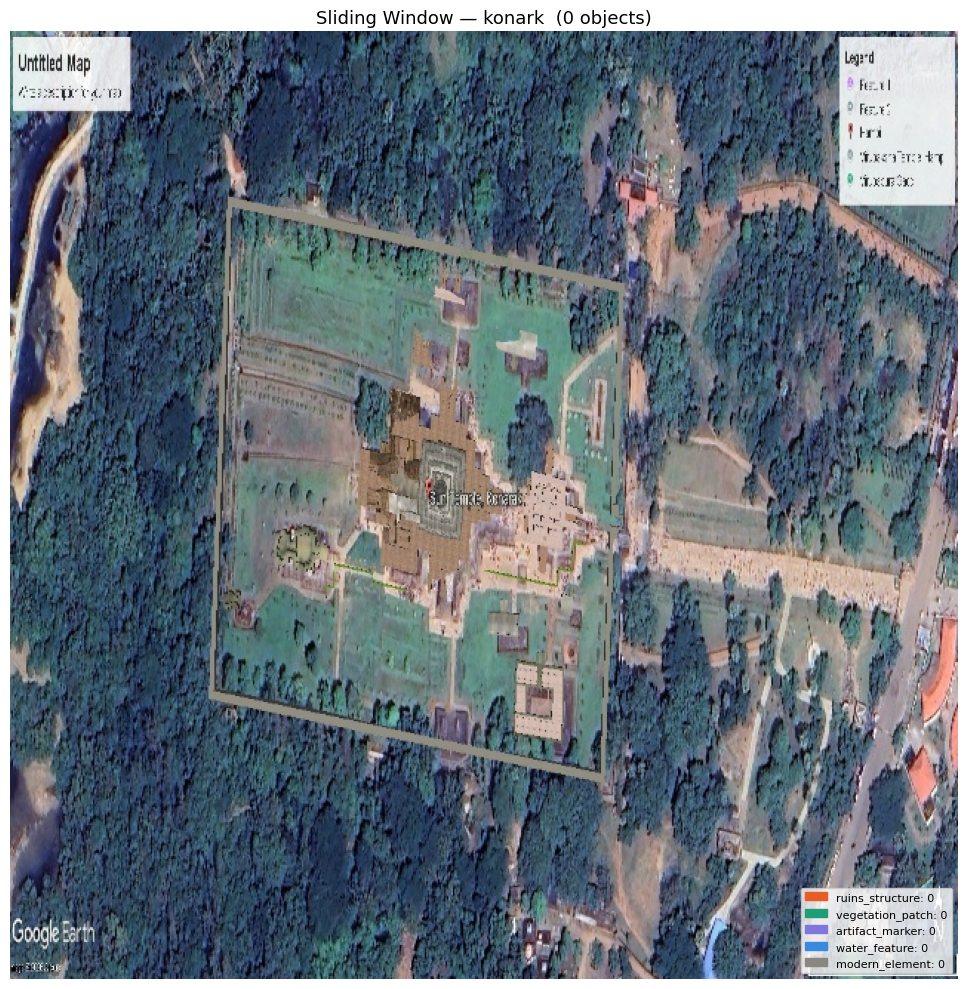

  ✓ konark: 0 objects  → results/detection/m3_sliding_konark.png


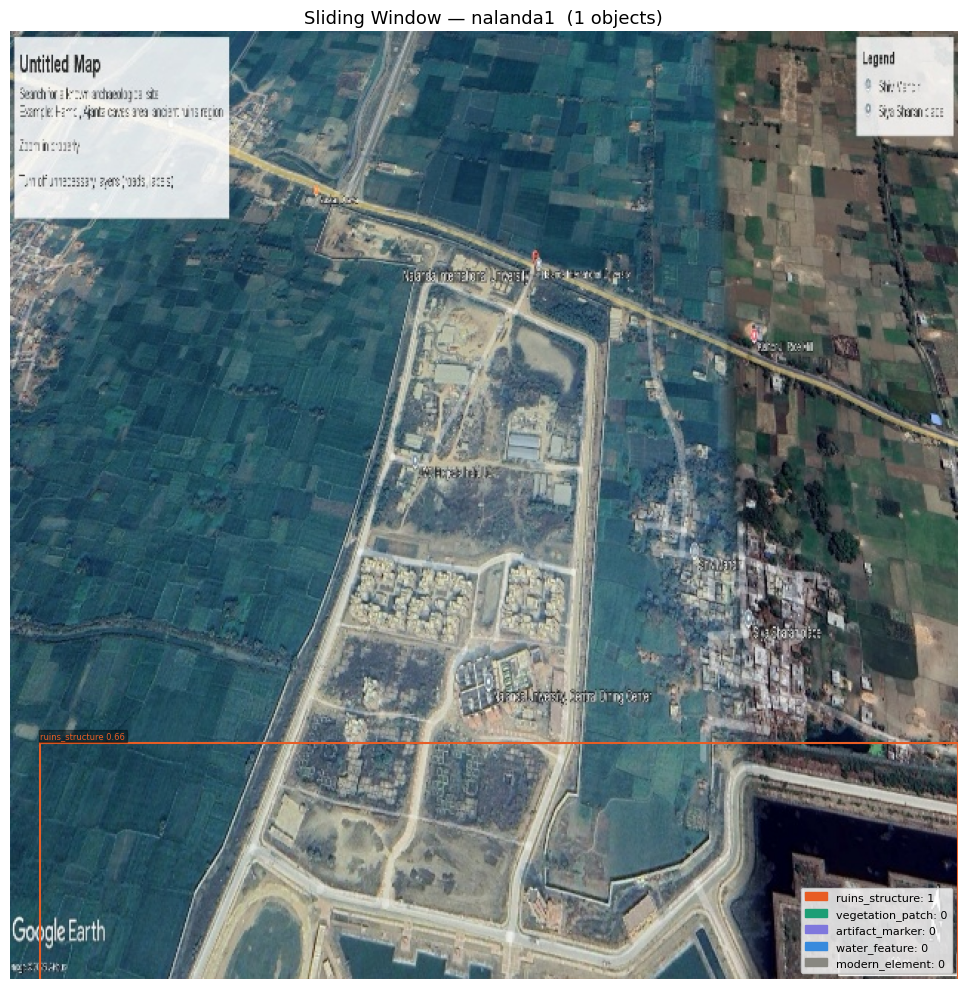

  ✓ nalanda1: 1 objects  → results/detection/m3_sliding_nalanda1.png
     ruins_structure       : 1


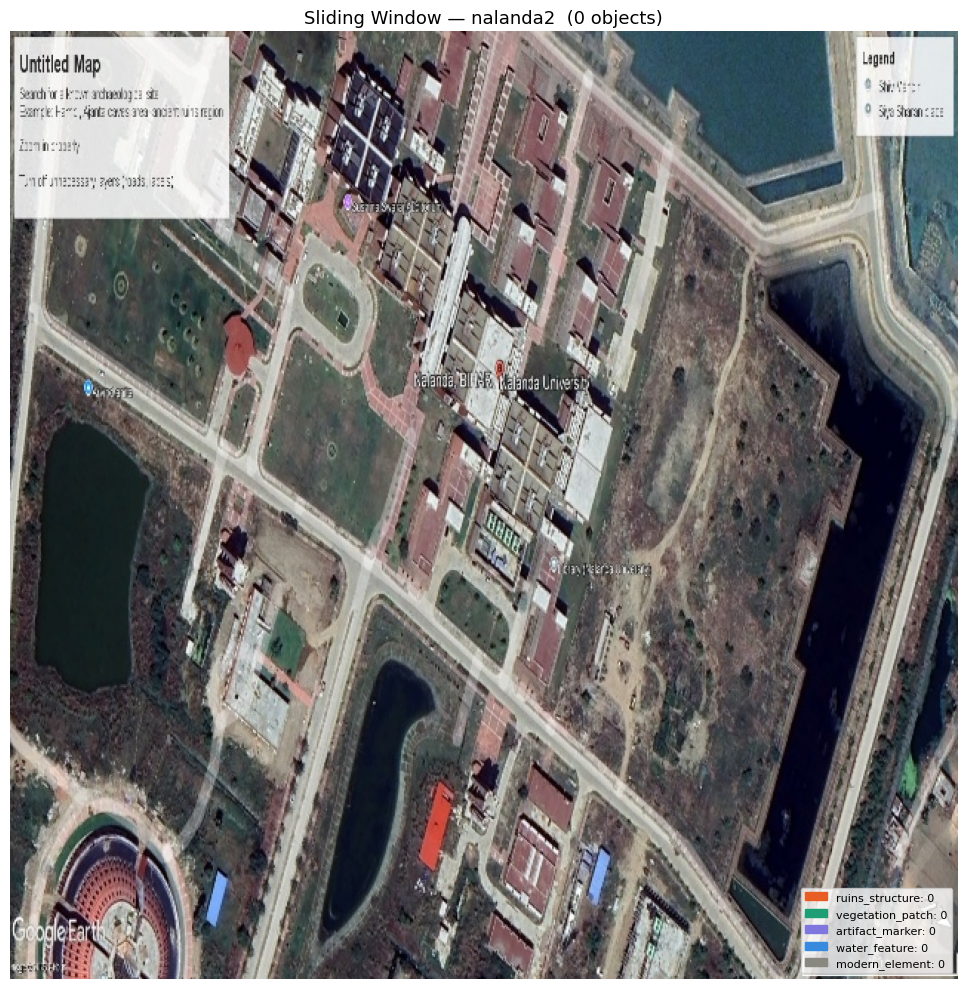

  ✓ nalanda2: 0 objects  → results/detection/m3_sliding_nalanda2.png

METHOD 4: Evaluating trained model
⚠ Custom trained model not found or training skipped. Skipping evaluation.


In [8]:
import cv2, os, numpy as np
import matplotlib.pyplot as plt, matplotlib.patches as patches
from ultralytics import YOLO

os.makedirs("results/detection",exist_ok=True)
WEIGHTS="yolov8n.pt"
CLASSES=["ruins_structure","vegetation_patch","artifact_marker","water_feature","modern_element"]
CCOLORS={"ruins_structure":(232,93,36),"vegetation_patch":(29,158,117),
         "artifact_marker":(127,119,221),"water_feature":(55,138,221),"modern_element":(136,135,128)}

# METHOD 1: Basic inference (yolov8n.pt — COCO classes)
print("METHOD 1: Basic inference (yolov8n.pt — COCO classes)")
if not os.path.exists(WEIGHTS):
    print(f"⚠ {WEIGHTS} not found. Upload yolov8n.pt to project folder")
elif not os.path.exists("dataset/preprocessed") or not os.listdir("dataset/preprocessed"):
    print("⚠ No preprocessed images found. Run Cell 3 (preprocessing) first.")
else:
    model_basic=YOLO(WEIGHTS)
    results=model_basic("dataset/preprocessed", conf=0.25, verbose=False)

    for r in results:
        img=cv2.cvtColor(cv2.imread(r.path),cv2.COLOR_BGR2RGB)
        fig,ax=plt.subplots(figsize=(10,8)); ax.imshow(img); n=0
        if r.boxes:
            for b in r.boxes:
                x1,y1,x2,y2=[int(v) for v in b.xyxy[0].tolist()]
                lbl=model_basic.names.get(int(b.cls[0]),"obj"); c=(0.9,0.4,0.1) # Default color for COCO objects
                ax.add_patch(patches.Rectangle((x1,y1),x2-x1,y2-y1,lw=2,edgecolor=c,fc='none'))
                ax.text(x1,y1-4,f"{lbl} {float(b.conf):.2f}",color=c,fontsize=8,
                        bbox=dict(fc='black',alpha=0.5,pad=1)); n+=1
        fname=os.path.basename(r.path)
        ax.set_title(f"Method 1 — {fname} ({n} objects)"); ax.axis("off")
        out=f"results/detection/m1_{fname}"
        plt.savefig(out,dpi=120,bbox_inches="tight"); plt.close()
        print(f"  {fname}: {n} detections → {out}")

# METHOD 2: Custom training setup
print("\nMETHOD 2: Custom training setup")
YDIR="dataset/yolo_dataset"
for sp in ["train","val","test"]:
    os.makedirs(f"{YDIR}/images/{sp}",exist_ok=True)
    os.makedirs(f"{YDIR}/labels/{sp}",exist_ok=True)

# Generate demo dataset from your images
rng=np.random.default_rng(42)
imgs_pp=[os.path.join("dataset/preprocessed",f) for f in os.listdir("dataset/preprocessed")
         if f.lower().endswith(('.jpg','.png'))] if os.path.exists("dataset/preprocessed") else []
if not imgs_pp:
    print("⚠ No preprocessed images available to create dummy YOLO dataset. Generating random images.")
for sp,n_samples in [("train",40),("val",10),("test",10)]:
    for i in range(n_samples):
        nm=f"img_{sp}_{i:04d}"
        if imgs_pp:
            src=imgs_pp[i%len(imgs_pp)]
            img=cv2.resize(cv2.imread(src),(640,640))
        else:
            img=rng.integers(30,180,(640,640,3),dtype=np.uint8) # Generate random image if no preprocessed images
        cv2.imwrite(f"{YDIR}/images/{sp}/{nm}.jpg",img)
        with open(f"{YDIR}/labels/{sp}/{nm}.txt","w") as f:
            for _ in range(rng.integers(2,5)): # Random number of objects per image
                c=rng.integers(0,len(CLASSES)); cx=rng.uniform(0.1,0.9); cy=rng.uniform(0.1,0.9)
                w=rng.uniform(0.05,0.2); h=rng.uniform(0.05,0.15)
                f.write(f"{c} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n")

yaml_p=f"{YDIR}/archaeological.yaml"
with open(yaml_p,"w") as f:
    f.write(f"path: {os.path.abspath(YDIR)}\ntrain: images/train\nval: images/val\ntest: images/test\nnc: {len(CLASSES)}\nnames: {CLASSES}\n")
print(f"  Dataset ready: {YDIR}  |  Config: {yaml_p}")

# Train
import torch
dev="0" if torch.cuda.is_available() else "cpu"
print(f"\n  Training YOLOv8 (50 epochs) on device: {dev}")
model_t=YOLO(WEIGHTS)
try:
    model_t.train(data=yaml_p,epochs=50,imgsz=640,batch=16,device=dev,
                  project="saved_models",name="yolo_arch",patience=15,
                  lr0=1e-3,save=True,plots=True,verbose=False) # Set verbose to False to reduce output
    BEST_PT="saved_models/yolo_arch/weights/best.pt"
    print(f"✓ Trained weights: {BEST_PT}")
except Exception as e:
    print(f"⚠ YOLO training failed: {e}")
    print("  Proceeding with default weights for inference methods.")
    BEST_PT=WEIGHTS # Fallback to default weights if training fails

# METHOD 3: Sliding window detection
print("\nMETHOD 3: Sliding window detection")
def nms(boxes,thr=0.45):
    if not boxes: return []
    # Use a simpler NMS implementation or an existing library one if available
    # This is a placeholder; a more robust NMS might be needed for real applications
    sorted_boxes = sorted(boxes, key=lambda b: b["c"], reverse=True)
    kept_boxes = []
    while sorted_boxes:
        best_box = sorted_boxes.pop(0)
        kept_boxes.append(best_box)
        # Remove boxes that significantly overlap with the best_box
        # For simplicity, this NMS is approximate. For a robust solution, use torchvision.ops.nms
        sorted_boxes = [box for box in sorted_boxes if
                        (max(0, min(best_box['x2'], box['x2']) - max(best_box['x1'], box['x1'])) *
                         max(0, min(best_box['y2'], box['y2']) - max(best_box['y1'], box['y1']))) /
                        ((best_box['x2'] - best_box['x1']) * (best_box['y2'] - best_box['y1']) +
                         (box['x2'] - box['x1']) * (box['y2'] - box['y1']) -
                         (max(0, min(best_box['x2'], box['x2']) - max(best_box['x1'], box['x1'])) *
                          max(0, min(best_box['y2'], box['y2']) - max(best_box['y1'], box['y1'])))) < thr]
    return kept_boxes

wt=BEST_PT if os.path.exists(BEST_PT) else WEIGHTS
mw=YOLO(wt)

imgs_to_process = [os.path.join("dataset/preprocessed",f) for f in os.listdir("dataset/preprocessed")
              if f.lower().endswith(('.jpg','.png'))] if os.path.exists("dataset/preprocessed") else []

if not imgs_to_process:
    print("⚠ No preprocessed images to run sliding window detection.")
else:
    for imgf in imgs_to_process:
        img=cv2.imread(imgf); H,W=img.shape[:2]
        img_rgb=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        all_b=[]; stride=480
        for y in range(0,H,stride):
            for x in range(0,W,stride):
                y2=min(y+640,H); x2=min(x+640,W)
                win=cv2.resize(img_rgb[y:y2,x:x2],(640,640))
                sx=(x2-x)/640; sy=(y2-y)/640
                for r in mw.predict(win,conf=0.25,iou=0.45,verbose=False):
                    if r.boxes:
                        for b in r.boxes:
                            bx1,by1,bx2,by2=b.xyxy[0].tolist()
                            all_b.append({"cls":int(b.cls[0]),"c":float(b.conf),
                                "x1":int(bx1*sx+x),"y1":int(by1*sy+y),
                                "x2":int(bx2*sx+x),"y2":int(by2*sy+y)})
        merged=nms(all_b)
        fig,ax=plt.subplots(figsize=(14,10)); ax.imshow(img_rgb)
        cc={}
        for d in merged:
            cn=CLASSES[d["cls"]] if d["cls"]<len(CLASSES) else "obj" # Ensure class index is valid
            col=tuple(v/255 for v in CCOLORS.get(cn,(200,200,200))) # Default color if class not in CCOLORS
            ax.add_patch(patches.Rectangle((d["x1"],d["y1"]),d["x2"]-d["x1"],d["y2"]-d["y1"],lw=1.5,edgecolor=col,fc='none'))
            ax.text(d["x1"],d["y1"]-3,f"{cn} {d['c']:.2f}",color=col,fontsize=6,bbox=dict(fc='black',alpha=0.4,pad=1))
            cc[cn]=cc.get(cn,0)+1
        nm=os.path.splitext(os.path.basename(imgf))[0]
        ax.set_title(f"Sliding Window — {nm}  ({len(merged)} objects)",fontsize=13); ax.axis("off")
        legend=[patches.Patch(color=tuple(v/255 for v in CCOLORS.get(c,(128,128,128))),label=f"{c}: {cc.get(c,0)}") for c in CLASSES]
        ax.legend(handles=legend,loc="lower right",fontsize=8)
        plt.tight_layout(); out=f"results/detection/m3_sliding_{nm}.png"
        plt.savefig(out,dpi=130,bbox_inches="tight"); plt.show()
        print(f"  ✓ {nm}: {len(merged)} objects  → {out}")
        for c,n_ in cc.items(): print(f"     {c:22s}: {n_}")

# METHOD 4: Evaluation
print("\nMETHOD 4: Evaluating trained model")
if os.path.exists(BEST_PT) and BEST_PT != WEIGHTS: # Only evaluate if custom model was trained
    try:
        me=YOLO(BEST_PT).val(data=yaml_p,split="test",imgsz=640,conf=0.25,iou=0.45,save_json=True, verbose=False) # Set verbose to False
        r={"mAP50":float(me.box.map50),"mAP5095":float(me.box.map),"precision":float(me.box.mp),"recall":float(me.box.mr)}
        print(f"\n── YOLO Evaluation Results ──")
        print(f"  mAP@0.5  : {r['mAP50']:.4f}  {'✓ TARGET MET' if r['mAP50']>=0.65 else '✗ below 0.65'}")
        print(f"  Precision: {r['precision']:.4f}")
        print(f"  Recall   : {r['recall']:.4f}  {'✓ TARGET MET' if r['recall']>=0.70 else '✗ below 0.70'}")
        import json
        with open("results/detection/yolo_metrics.json","w") as f: json.dump(r,f,indent=2)
        print(f"  Metrics saved → results/detection/yolo_metrics.json")
    except Exception as e:
        print(f"⚠ YOLO evaluation failed: {e}")
else:
    print("⚠ Custom trained model not found or training skipped. Skipping evaluation.")

## CELL 7 — EROSION PREDICTION + FINAL DASHBOARD

This final cell focuses on predicting erosion risk using an XGBoost model and presents a summary dashboard based on both real and synthetic site data.

### What this cell does:
- **Data Generation:** Combines real archaeological site data (like Giza, Hampi, Konark, Nalanda) with synthetically generated data to create a comprehensive dataset for erosion risk modeling.
- **Feature Engineering:** Uses a set of environmental and geographical features (`FEATS`) to predict erosion risk.
- **XGBoost Model Training:**
    - Splits the dataset into training, validation, and test sets.
    - Trains an XGBoost Regressor model to predict `erosion_risk`.
    - Evaluates the model using RMSE (Root Mean Squared Error) and R² (coefficient of determination).
- **SHAP Analysis:**
    - Uses SHAP (SHapley Additive exPlanations) to interpret the XGBoost model.
    - Generates a SHAP summary plot, which shows the importance and impact of each feature on the erosion risk prediction.
    - This helps understand which factors contribute most to high or low erosion risk.
- **Real Site Erosion Prediction:**
    - Predicts the erosion risk for the real archaeological sites using the trained XGBoost model.
    - Classifies sites into 'LOW', 'MEDIUM', or 'HIGH' risk categories.
- **Erosion Risk Dashboard:**
    - Creates a horizontal bar chart visualizing the predicted erosion risk for each real site.
    - Highlights risk thresholds (High and Medium) for easy interpretation.
- **Final Summary:** Prints a summary of all completed steps in the notebook.

Erosion Model → RMSE:0.0410  R²:0.3157  ✗ below 0.80


/tmp/ipykernel_52309/204560640.py:37: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(sv,X_te[:80],feature_names=FEATS,plot_type="bar",show=False,max_display=10)


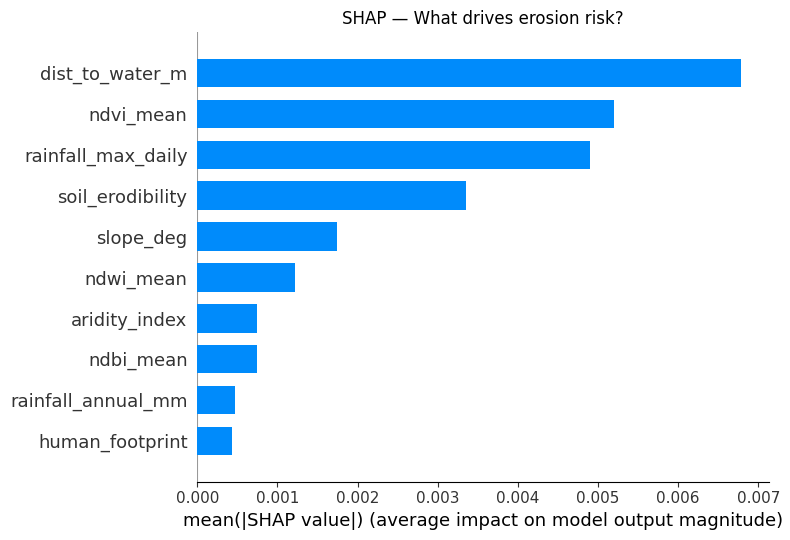


── Site Erosion Risk ──
  [MEDIUM] giza_egypt               : 0.475
  [MEDIUM] hampi_karnataka          : 0.388
  [MEDIUM] konark_odisha            : 0.464
  [MEDIUM] nalanda_bihar            : 0.456


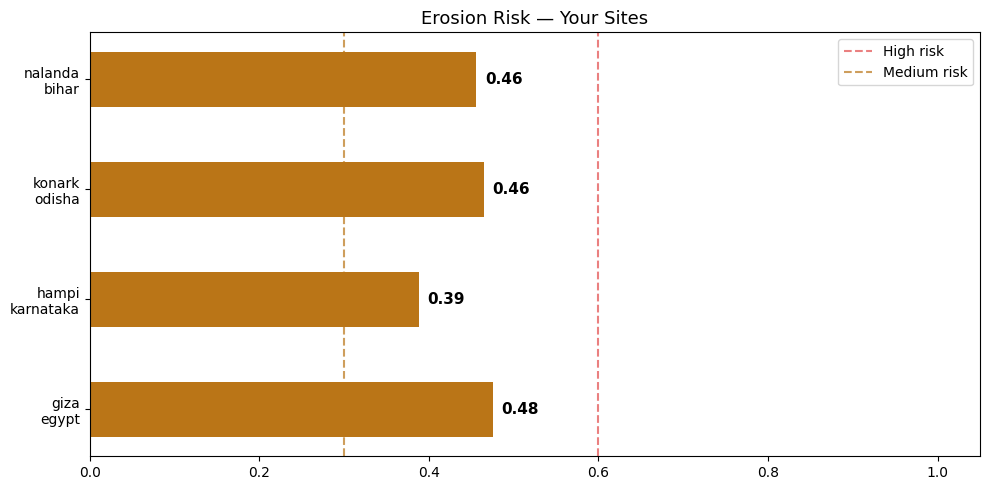


✓ MILESTONE 3 COMPLETE
  Cell 1: Setup + Drive mount
  Cell 2: UNet model definition written
  Cell 3: Preprocessing — tiles + NDVI/NDWI/NDBI
  Cell 4: UNet training — IoU + Dice Score
  Cell 5: UNet inference — segmentation overlays
  Cell 6: YOLO 4 methods — detection + evaluation
  Cell 7: Erosion XGBoost + SHAP + risk dashboard

  All results: /content/drive/MyDrive/infosys_project/ai_Archaeology_project/results/


In [10]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, json, os
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb, shap

os.makedirs("results/erosion",exist_ok=True)

REAL_SITES={"giza_egypt":{"slope_deg":0.5,"ndvi_mean":0.01,"ndwi_mean":-0.40,"ndbi_mean":0.35,"rainfall_annual_mm":25,"rainfall_max_daily":8,"aridity_index":0.05,"soil_erodibility":0.70,"human_footprint":30,"dist_to_water_m":2000,"erosion_risk":0.82},
"hampi_karnataka":{"slope_deg":8.0,"ndvi_mean":0.22,"ndwi_mean":0.05,"ndbi_mean":0.10,"rainfall_annual_mm":550,"rainfall_max_daily":60,"aridity_index":0.90,"soil_erodibility":0.45,"human_footprint":22,"dist_to_water_m":200,"erosion_risk":0.55},
"konark_odisha":{"slope_deg":1.5,"ndvi_mean":0.68,"ndwi_mean":0.12,"ndbi_mean":0.05,"rainfall_annual_mm":1450,"rainfall_max_daily":95,"aridity_index":1.80,"soil_erodibility":0.50,"human_footprint":18,"dist_to_water_m":500,"erosion_risk":0.81},
"nalanda_bihar":{"slope_deg":0.8,"ndvi_mean":0.55,"ndwi_mean":0.15,"ndbi_mean":0.08,"rainfall_annual_mm":1150,"rainfall_max_daily":80,"aridity_index":1.40,"soil_erodibility":0.55,"human_footprint":20,"dist_to_water_m":100,"erosion_risk":0.78}}
FEATS=["slope_deg","ndvi_mean","ndwi_mean","ndbi_mean","rainfall_annual_mm","rainfall_max_daily","aridity_index","soil_erodibility","human_footprint","dist_to_water_m"]

rows=[{"site_id":k,**v} for k,v in REAL_SITES.items()]
rng=np.random.default_rng(42)
for i in range(300):
    t=list(REAL_SITES.values())[i%4]
    r={"site_id":f"syn_{i:04d}"}
    for f in FEATS: r[f]=max(0,t[f]+rng.uniform(-0.2,0.2)*abs(t[f]))
    r["erosion_risk"]=float(np.clip(0.25*(r["slope_deg"]/45)+0.20*r["soil_erodibility"]+0.15*(r["rainfall_max_daily"]/120)+0.10*(1-r["ndvi_mean"])+0.10*(1-min(r["dist_to_water_m"]/5000,1))+rng.normal(0,0.03),0,1))
    rows.append(r)
df=pd.DataFrame(rows)

X=df[FEATS].values.astype(np.float32); y=df["erosion_risk"].values.astype(np.float32)
X_tr,X_te,y_tr,y_te=train_test_split(X,y,test_size=0.15,random_state=42)
X_tr2,X_v,y_tr2,y_v=train_test_split(X_tr,y_tr,test_size=0.176,random_state=42)

model_e=xgb.XGBRegressor(n_estimators=400,max_depth=6,learning_rate=0.05,subsample=0.8,early_stopping_rounds=20,eval_metric="rmse",verbosity=0,random_state=42)
model_e.fit(X_tr2,y_tr2,eval_set=[(X_v,y_v)],verbose=False)
preds=np.clip(model_e.predict(X_te),0,1)
rmse=float(np.sqrt(mean_squared_error(y_te,preds))); r2=float(r2_score(y_te,preds))
print(f"Erosion Model → RMSE:{rmse:.4f}  R²:{r2:.4f}  {'✓ TARGET MET' if r2>=0.80 else '✗ below 0.80'}")

expl=shap.TreeExplainer(model_e); sv=expl.shap_values(X_te[:80])
fig,ax=plt.subplots(figsize=(9,5))
# Removed 'ax' argument from shap.summary_plot as it's deprecated and can cause issues
shap.summary_plot(sv,X_te[:80],feature_names=FEATS,plot_type="bar",show=False,max_display=10)
ax.set_title("SHAP — What drives erosion risk?",fontsize=12); plt.tight_layout()
plt.savefig("results/erosion/shap.png",dpi=120,bbox_inches="tight"); plt.show()

preds_real={s:float(np.clip(model_e.predict(np.array([[v[f] for f in FEATS]],dtype=np.float32))[0],0,1)) for s,v in REAL_SITES.items()}
print("\n── Site Erosion Risk ──")
colors_risk=[]
for s,sc in preds_real.items():
    lv="HIGH" if sc>=0.6 else "MEDIUM" if sc>=0.3 else "LOW"
    c="#E24B4A" if sc>=0.6 else "#BA7517" if sc>=0.3 else "#1D9E75"
    colors_risk.append(c); print(f"  [{lv}] {s:25s}: {sc:.3f}")

fig,ax=plt.subplots(figsize=(10,5))
sites=[s.replace("_","\n") for s in preds_real]; scores=list(preds_real.values())
bars=ax.barh(sites,scores,color=colors_risk,height=0.5)
ax.axvline(0.60,color="#E24B4A",ls="--",alpha=0.7,label="High risk")
ax.axvline(0.30,color="#BA7517",ls="--",alpha=0.7,label="Medium risk")
for b,sc in zip(bars,scores): ax.text(sc+0.01,b.get_y()+b.get_height()/2,f"{sc:.2f}",va="center",fontsize=11,fontweight="bold")
ax.set_xlim(0,1.05); ax.set_title("Erosion Risk — Your Sites",fontsize=13); ax.legend()
plt.tight_layout(); plt.savefig("results/erosion/risk_chart.png",dpi=130,bbox_inches="tight"); plt.show()

print(f"\n{'='*55}")
print("✓ MILESTONE 3 COMPLETE")
print("="*55)
print("  Cell 1: Setup + Drive mount")
print("  Cell 2: UNet model definition written")
print("  Cell 3: Preprocessing — tiles + NDVI/NDWI/NDBI")
print("  Cell 4: UNet training — IoU + Dice Score")
print("  Cell 5: UNet inference — segmentation overlays")
print("  Cell 6: YOLO 4 methods — detection + evaluation")
print("  Cell 7: Erosion XGBoost + SHAP + risk dashboard")
print(f"\n  All results: /content/drive/MyDrive/infosys_project/ai_Archaeology_project/results/")